# Caltech UCSD Birds 200 2011 (CUB-200-2011)

## Part 5B - Extracting the output layer activations.

The previous notebooks showed how to train a ResNet 152 model which had been initialised with pre-trained weights from ImageNet, for the task of fine grained image classification of bird species using the CUB-200-2011 dataset, and evaluate its performance by investigating the class accuracy of each class of birds. We then extracted the activations from the final layer before the classification layer.

This notebook shows how to use these extracted activations of the final layer of the model to investigate what the model has learnt about the input image set used to train it. We achieve this through a mathetical transform, that allows us to take this very large and cumbersome dataset, which contains many degrees of freedom, and reduce it down to a 2D dimensional representation. That way, as humans, we can plot the resulting transformation and use to infer how our model is performing.

This is the fifth stage of our roadmap for building and understanding a birds image classifier:

![RoadMapImage](../docs/birds_roadmap.png)

This notebook will show in detail:

    1. Reducing the number dimensions (columns) in the activations dataset.
    
    2. Perform a transformation that reduces our dataset down to 2D for plotting (manifold learning).
    
    3. Plotting of 2D transformed results in static and dynamic plots to aid in interpretation.

## Notebook setup

### Modules and externals

In [1]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
import torchvision.transforms as transforms
from torchvision import datasets, models

#from imutils import paths
from pathlib import Path
import os, sys
import time
import copy

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Local modules
from cub_tools.train import train_model
from cub_tools.visualize import imshow, visualize_model
from cub_tools.utils import unpickle, save_pickle
from cub_tools.transforms import makeDefaultTransforms

### Runtime setup

In [2]:
# Script runtime options
root_dir = '..' # '/home/jupyter/caltech_birds'
model = 'resnet152'
data_root_dir = os.path.join(root_dir, 'data')
model_root_dir = os.path.join(root_dir, 'models')
stages = ['test']


# Paths setup
data_dir = os.path.join(data_root_dir,'images')
output_dir = os.path.join(model_root_dir,'classification/{}'.format(model))
model_history = os.path.join(output_dir,'model_history.pkl')
model_file = os.path.join(output_dir, 'caltech_birds_{}_full.pth'.format(model))

In [3]:
# Get data transforms
data_transforms = makeDefaultTransforms()

In [4]:
# Setup data loaders with augmentation transforms
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x])
                  for x in stages}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=1,
                                             shuffle=True, num_workers=4)
              for x in stages}
dataset_sizes = {x: len(image_datasets[x]) for x in stages}
class_names = image_datasets[stages[0]].classes

In [5]:
# Load the extracted feature maps
feature_maps_dict = unpickle(os.path.join(output_dir,'resnet152_feature_extractions.pkl'))
features = np.array(feature_maps_dict['feature extractions']).squeeze()

In [6]:
feature_maps_dict.keys()

dict_keys(['labels truth', 'labels pred', 'image paths', 'feature extractions'])

# Domain Reduction - Principal Components Analysis

## Assess all components

Compute all components to assess the number of components required to reconstruct 95% of the feature map information.

In [7]:
# Domain reduction
from sklearn.decomposition import PCA

In [8]:
pca = PCA()
pca.fit(features)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [9]:
cum_explained_variance_ratio= []
cumsum=0.
for comp in pca.explained_variance_ratio_:
    cumsum += comp
    cum_explained_variance_ratio.append( cumsum )

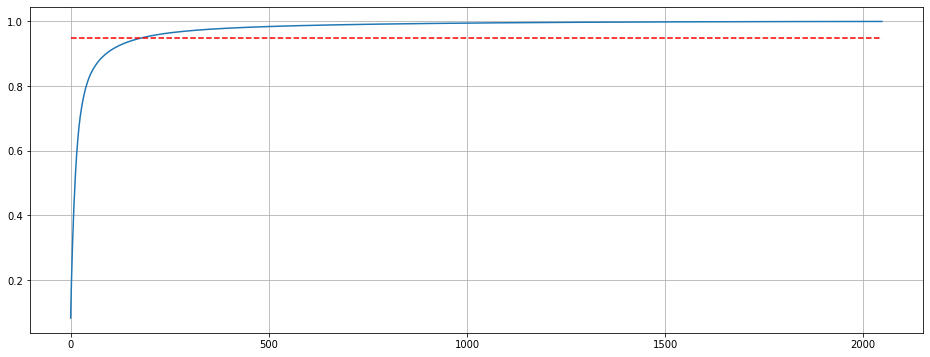

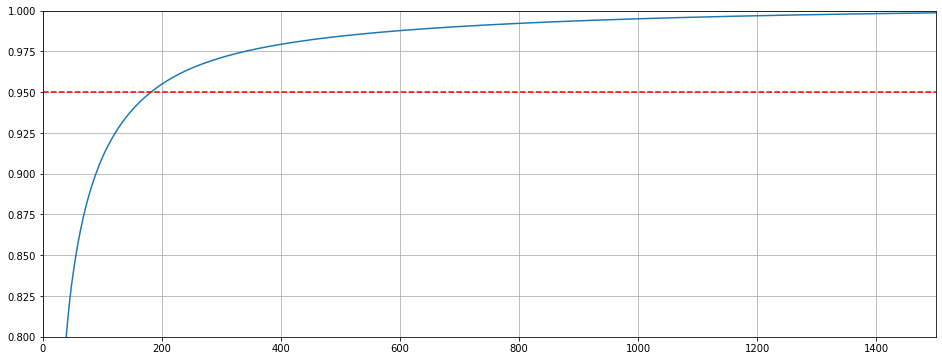

In [10]:
plt.figure(figsize=(16,6))
plt.plot(np.arange(0,len(cum_explained_variance_ratio),1),cum_explained_variance_ratio)
plt.plot([0, len(cum_explained_variance_ratio)], [0.95, 0.95], 'r--')
plt.grid(True)
plt.yscale('linear')
plt.show()

plt.figure(figsize=(16,6))
plt.plot(np.arange(0,len(cum_explained_variance_ratio),1),cum_explained_variance_ratio)
plt.plot([0, len(cum_explained_variance_ratio)], [0.95, 0.95], 'r--')
plt.grid(True)
plt.yscale('linear')
plt.ylim([0.8,1.0])
plt.xlim([0, 1500])
plt.show()

## Compute the PCA transform and apply to the feature maps

200 components was found to recover ~95% of the variance in the data.
This is domain reduction from 2048 to 200 dimensions.

In [11]:
pca = PCA(n_components=200)
pca.fit(features)

PCA(copy=True, iterated_power='auto', n_components=200, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [12]:
pca_features = pca.transform(features)

In [13]:
pca_features.shape

(5794, 200)

In [14]:
pca_features_dict = {'pca_features' : pca_features,
                     'pca_model' : pca,
                     'n_components' : 200,
                     'cumulative explained variance ratio (all components)' : cum_explained_variance_ratio}

In [15]:
save_pickle(pca_features_dict, os.path.join(output_dir,'{}_pca_feature_extractions.pkl'.format(model)))

# Manifold Learning Representations


In [16]:
def get_manifold_df(trf_data, labels, class_names, img_paths):
    labels_name = []
    for label in labels:
        labels_name.append( class_names[label] )
    return pd.DataFrame({'Manifold Dim 1' : trf_data[:,0], 
                         'Manifold Dim 2' : trf_data[:,1], 
                         'label (truth)' : labels, 
                         'class name (truth)' : labels_name,
                         'image path' : img_paths})

## t-SNE of image feature maps

In [17]:
from sklearn.manifold import TSNE

In [18]:
tsne = TSNE(n_components=2, learning_rate=150, perplexity=50, angle=0.2, verbose=2).fit_transform(pca_features)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 5794 samples in 0.086s...
[t-SNE] Computed neighbors for 5794 samples in 10.153s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5794
[t-SNE] Computed conditional probabilities for sample 2000 / 5794
[t-SNE] Computed conditional probabilities for sample 3000 / 5794
[t-SNE] Computed conditional probabilities for sample 4000 / 5794
[t-SNE] Computed conditional probabilities for sample 5000 / 5794
[t-SNE] Computed conditional probabilities for sample 5794 / 5794
[t-SNE] Mean sigma: 6.142376
[t-SNE] Computed conditional probabilities in 0.564s
[t-SNE] Iteration 50: error = 85.9346085, gradient norm = 0.0073667 (50 iterations in 1.842s)
[t-SNE] Iteration 100: error = 75.3764267, gradient norm = 0.0027549 (50 iterations in 1.602s)
[t-SNE] Iteration 150: error = 74.1944199, gradient norm = 0.0005907 (50 iterations in 1.419s)
[t-SNE] Iteration 200: error = 73.9829330, gradient norm = 0.0001374 (50 iterations in 1.755s)


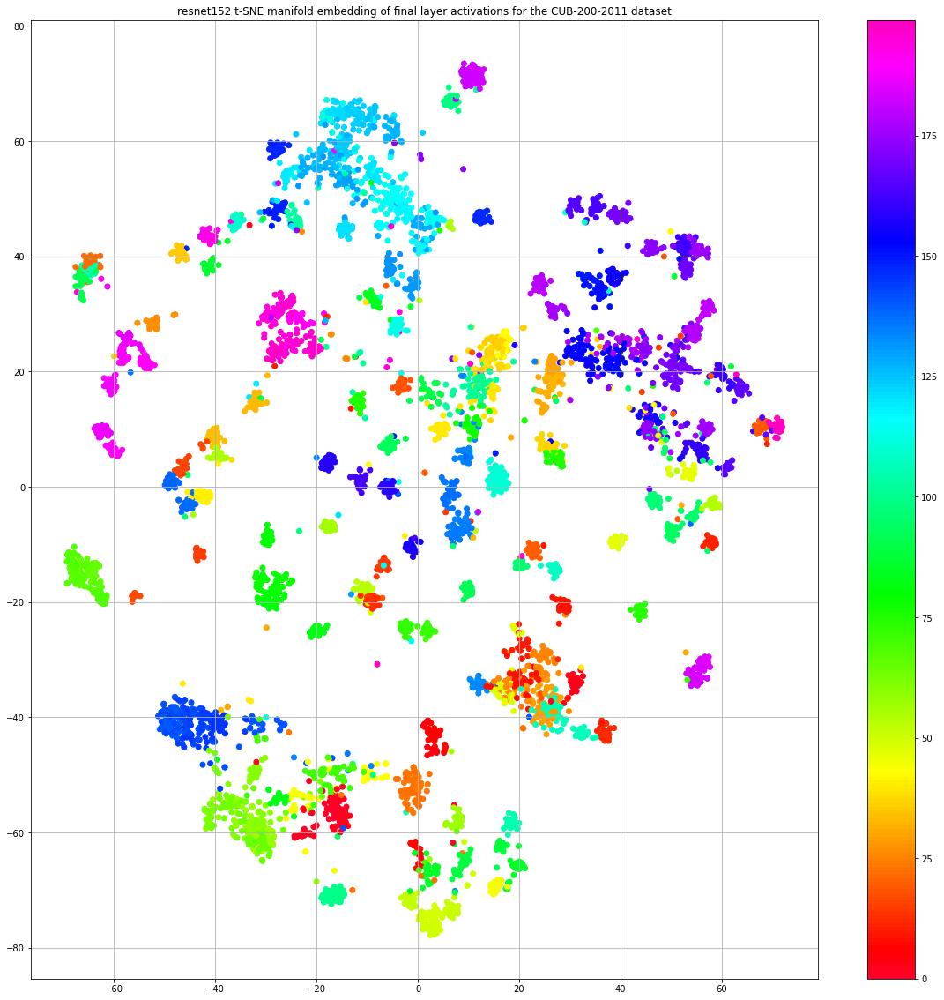

In [19]:
plt.figure(figsize=(20,20))
plt.scatter(tsne[:,0], tsne[:,1], c=feature_maps_dict['labels truth'], cmap='gist_rainbow')
plt.colorbar()
plt.grid(True)
plt.title(model+' t-SNE manifold embedding of final layer activations for the CUB-200-2011 dataset')
plt.show()

In [20]:
tsne_df = get_manifold_df(trf_data=tsne, 
                          labels=feature_maps_dict['labels truth'], 
                          class_names=class_names, 
                          img_paths=feature_maps_dict['image paths'])

In [21]:
tsne_df

,Manifold Dim 1,Manifold Dim 2,label (truth),class name (truth),image path
0,49.972244,-8.045976,94,095.Baltimore_Oriole,../data/images/test/095.Baltimore_Oriole/Balti...
1,3.953524,-65.929932,85,086.Pacific_Loon,../data/images/test/086.Pacific_Loon/Pacific_L...
2,-45.685307,3.190753,16,017.Cardinal,../data/images/test/017.Cardinal/Cardinal_0093...
3,36.556831,-42.782303,12,013.Bobolink,../data/images/test/013.Bobolink/Bobolink_0114...
4,-4.607878,28.723293,113,114.Black_throated_Sparrow,../data/images/test/114.Black_throated_Sparrow...
...,...,...,...,...,...
5789,15.987507,-0.351733,111,112.Great_Grey_Shrike,../data/images/test/112.Great_Grey_Shrike/Grea...
5790,28.331518,31.360882,177,178.Swainson_Warbler,../data/images/test/178.Swainson_Warbler/Swain...
5791,-41.750355,-39.493698,144,145.Elegant_Tern,../data/images/test/145.Elegant_Tern/Elegant_T...
5792,1.948926,47.331036,115,116.Chipping_Sparrow,../data/images/test/116.Chipping_Sparrow/Chipp...


In [22]:
from PIL import Image, ImageDraw, ImageFont
import io
import base64
import numpy
from skimage.util import img_as_uint, img_as_ubyte
from skimage.io import imsave

In [23]:
img_scale_factor = 0.5

In [24]:
def encode_image(im):
    rawBytes = io.BytesIO()    
    im = Image.fromarray(img_as_ubyte(np.array(im)))
    im.save(rawBytes, "PNG")
    rawBytes.seek(0) 
    encoded_image = base64.b64encode(rawBytes.read()).decode()
    return f'data:image/png;base64,{encoded_image}'

def add_class_to_image(im, classname, textfill=(255,255,255,255), textsize=0.75, textpos=(10,10)):
    # Add the class name to the image
    txt = Image.new('RGBA', (int(im.size[0]*textsize),int(im.size[1]*textsize)), (255,255,255,0))
    d = ImageDraw.Draw(txt)
    font = ImageFont.load_default()
    d.text(textpos, classname, font=font, fill=textfill)
    return Image.alpha_composite(im.convert('RGBA'), txt.resize(im.size))

In [25]:
run_encoding = False
if run_encoding:
    print('[INFO] Encoding images (100):', end='')
    encoded_images = []
    encoded_thumbs = []
    for i, image in enumerate(tsne_df['image path']):
        if (i % 100==0):
            print('|',end='')
        if (i % 1000==0):
            print('{}'.format(i),end='')
        im =  Image.open(image)
        im = add_class_to_image(im, tsne_df['class name (truth)'].iloc[i])
        encoded_image.append(encode_image(im))
        encoded_thumbs.append(encode_image(im.resize((int(im.size[0]*img_scale_factor), int(im.size[1]*img_scale_factor)), resample=3)))
    print(':')
    tsne_df['encoded image'] = encoded_images
    tsne_df['encoded image thumbs'] = encoded_thumbs
    tsne_df.to_pickle(os.path.join(output_dir,'{}_tsne_feature_extractions.pkl'.format(model)))
else:
    tsne_df = pd.read_pickle(os.path.join(output_dir,'{}_tsne_feature_extractions.pkl'.format(model)))

In [26]:
tsne_df

,Manifold Dim 1,Manifold Dim 2,label (truth),class name (truth),image path,encoded image,encoded image thumbs
0,-2.980398,-52.962040,94,095.Baltimore_Oriole,../data/images/test/095.Baltimore_Oriole/Balti...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
1,64.719620,15.969509,85,086.Pacific_Loon,../data/images/test/086.Pacific_Loon/Pacific_L...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
2,21.956379,-64.955460,16,017.Cardinal,../data/images/test/017.Cardinal/Cardinal_0093...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
3,29.751053,5.794495,12,013.Bobolink,../data/images/test/013.Bobolink/Bobolink_0114...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
4,-27.157417,8.519850,113,114.Black_throated_Sparrow,../data/images/test/114.Black_throated_Sparrow...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
...,...,...,...,...,...,...,...
5789,-1.845755,5.936778,111,112.Great_Grey_Shrike,../data/images/test/112.Great_Grey_Shrike/Grea...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
5790,-43.146801,-21.351391,177,178.Swainson_Warbler,../data/images/test/178.Swainson_Warbler/Swain...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
5791,22.192770,57.085938,144,145.Elegant_Tern,../data/images/test/145.Elegant_Tern/Elegant_T...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."
5792,-47.261311,4.475277,115,116.Chipping_Sparrow,../data/images/test/116.Chipping_Sparrow/Chipp...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA..."


In [27]:
import hvplot.pandas

In [28]:
tsne_df.hvplot.scatter(x='Manifold Dim 1', 
                       y='Manifold Dim 2', 
                       by='label (truth)', 
                       frame_width=1000, 
                       frame_height=1000, 
                       hover_cols=['class name (truth)'], 
                       grid=True, cmap='gist_rainbow')

:NdOverlay   [label (truth)]
   :Scatter   [Manifold Dim 1]   (Manifold Dim 2,class name (truth))

In [ ]:
from bokeh.plotting import ColumnDataSource, figure, output_file, show

min_index = 0
max_index = 4500
x=tsne_df['Manifold Dim 1'][min_index:max_index]
y=tsne_df['Manifold Dim 2'][min_index:max_index]

# get a colormap from matplotlib
colormap = plt.cm.get_cmap("gist_rainbow") #choose any matplotlib colormap here

# define maximum and minimum for cmap
colorspan=[0,200]

# create a color channel with a value between 0 and 1
# outside the colorspan the value becomes 0 (left) and 1 (right)
cmap_input=np.interp(tsne_df['label (truth)'][min_index:max_index],colorspan,[0,1],left=0,right=1)

# use colormap to generate rgb-values
# second value is alfa (not used)
# third parameter gives int if True, otherwise float
A_color=colormap(cmap_input,1,True)

# convert to hex to fit to bokeh
bokeh_colors = ["#%02x%02x%02x" % (r, g, b) for r, g, b in A_color[:,0:3]]

output_file("caltech_birds_resnet152_featuremaps_tsne_embedding.html")

source = ColumnDataSource(data=dict(
    x=x,
    y=y,
    imgs=tsne_df['encoded image thumbs'][min_index:max_index],
    classnames=tsne_df['class name (truth)'][min_index:max_index],
    colors=bokeh_colors
))

TOOLTIPS = """
    <div>
        <div>
            <img
                src="@imgs" height="100" width="100"
                style="float: left; margin: 0px 15px 15px 0px;"
                border="2"
            ></img>
        </div>
        <div>
            <span style="font-size: 17px; font-weight: bold;">@classnames</span>
            <span style="font-size: 15px; color: #966;">[$index]</span>
        </div>
    </div>
"""

p = figure(plot_width=1200, plot_height=1200, tooltips=TOOLTIPS,
           title="Mouse over the dots")

p.circle('x', 'y',fill_color='colors', line_color=None, size=5, source=source, fill_alpha=0.3, line_alpha=0.3)

show(p)


In [40]:
from matplotlib.pyplot import imshow
from PIL import Image
import random
import rasterfairy

In [41]:
num_images_to_plot = 2500

if len(tsne_df['image path']) > num_images_to_plot:
    sort_order = sorted(random.sample(range(len(tsne_df['image path'])), num_images_to_plot))
    #images = [tsne_df['image path'][i] for i in sort_order]
    tsne_df__plotting = pd.DataFrame([tsne_df.iloc[i] for i in sort_order])
else:
    tsne_df__plotting = tsne_df

In [42]:
images = []
for id, path in zip(tsne_df__plotting.index,tsne_df__plotting['image path']):
    images.append(Image.open(path))
tsne_df__plotting['images'] = images

In [43]:
tsne_df__plotting

,Manifold Dim 1,Manifold Dim 2,label (truth),class name (truth),image path,encoded image,encoded image thumbs,images
3,29.751053,5.794495,12,013.Bobolink,../data/images/test/013.Bobolink/Bobolink_0114...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
5,-10.671788,67.925385,193,194.Cactus_Wren,../data/images/test/194.Cactus_Wren/Cactus_Wre...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
6,-44.685707,-50.685112,173,174.Palm_Warbler,../data/images/test/174.Palm_Warbler/Palm_Warb...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
7,41.387596,-39.336384,73,074.Florida_Jay,../data/images/test/074.Florida_Jay/Florida_Ja...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
10,-41.981678,20.490490,121,122.Harris_Sparrow,../data/images/test/122.Harris_Sparrow/Harris_...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
...,...,...,...,...,...,...,...,...
5783,-2.775566,-53.281078,94,095.Baltimore_Oriole,../data/images/test/095.Baltimore_Oriole/Balti...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
5788,-45.339443,-49.473248,173,174.Palm_Warbler,../data/images/test/174.Palm_Warbler/Palm_Warb...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
5789,-1.845755,5.936778,111,112.Great_Grey_Shrike,../data/images/test/112.Great_Grey_Shrike/Grea...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...
5790,-43.146801,-21.351391,177,178.Swainson_Warbler,../data/images/test/178.Swainson_Warbler/Swain...,"data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...","data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...",<PIL.JpegImagePlugin.JpegImageFile image mode=...


In [46]:
width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(tsne_df__plotting['image path'], tsne_df__plotting['Norm Manifold Dim 1'], tsne_df__plotting['Norm Manifold Dim 2']):
    tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

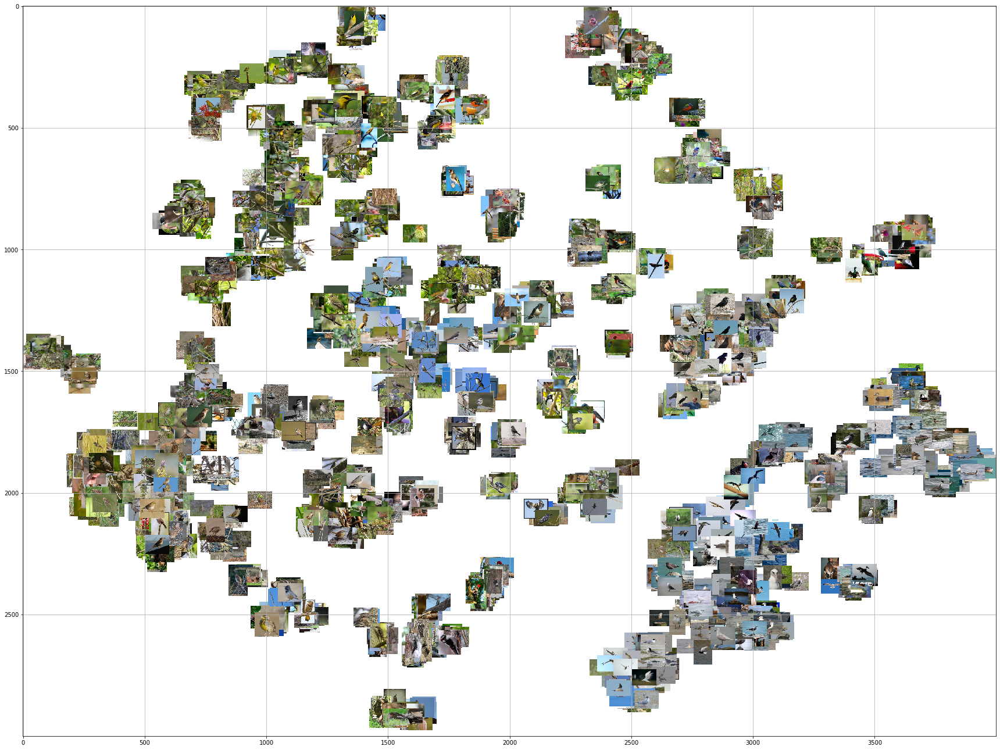

In [47]:
plt.figure(figsize = (30,25))
plt.imshow(full_image)
plt.grid(True)
plt.show()

In [48]:
# nx * ny = 1000, the number of images
nx = 50
ny = 50

# assign to grid
grid_assignment = rasterfairy.transformPointCloud2D(tsne_df__plotting[['Manifold Dim 1', 'Manifold Dim 2']].to_numpy(), target=(nx, ny))

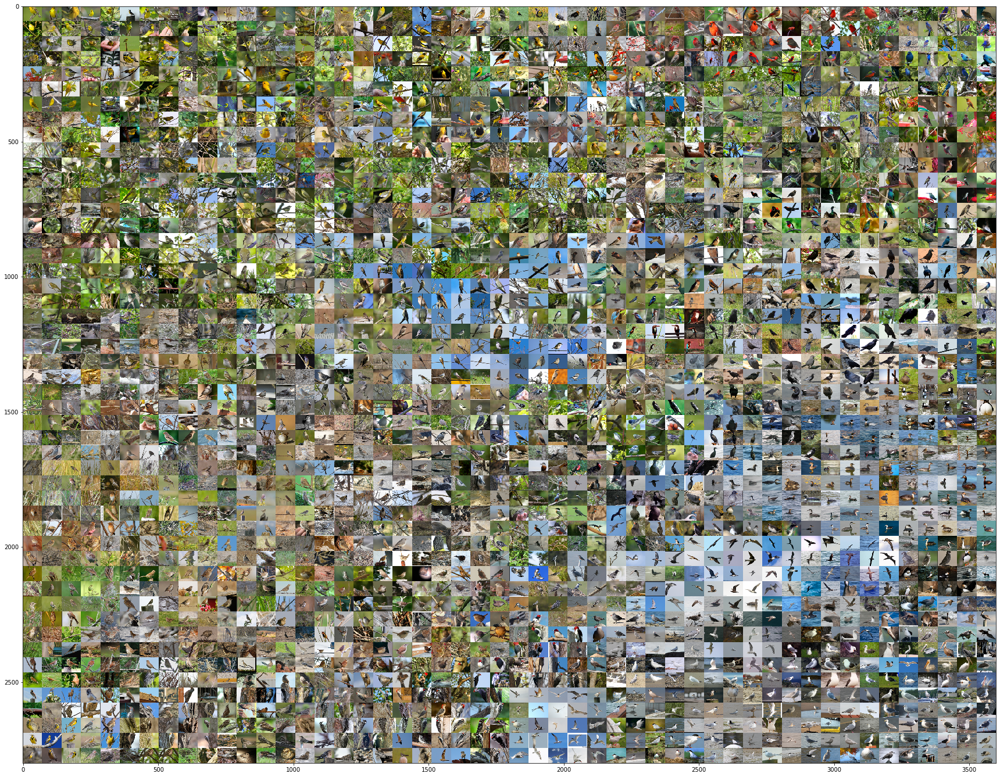

In [49]:
tile_width = 72
tile_height = 56

full_width = tile_width * nx
full_height = tile_height * ny
aspect_ratio = float(tile_width) / tile_height

grid_image = Image.new('RGB', (full_width, full_height))

for img, grid_pos in zip(tsne_df__plotting['image path'], grid_assignment[0]):
    idx_x, idx_y = grid_pos
    x, y = tile_width * idx_x, tile_height * idx_y
    tile = Image.open(img)
    tile_ar = float(tile.width) / tile.height  # center-crop the tile to match aspect_ratio
    if (tile_ar > aspect_ratio):
        margin = 0.5 * (tile.width - aspect_ratio * tile.height)
        tile = tile.crop((margin, 0, margin + aspect_ratio * tile.height, tile.height))
    else:
        margin = 0.5 * (tile.height - float(tile.width) / aspect_ratio)
        tile = tile.crop((0, margin, tile.width, margin + float(tile.width) / aspect_ratio))
    tile = tile.resize((tile_width, tile_height), Image.ANTIALIAS)
    grid_image.paste(tile, (int(x), int(y)))

plt.figure(figsize = (30,25))
plt.imshow(grid_image)
plt.show()

## UMAP of image feature maps

In [ ]:
from umap import UMAP

In [ ]:
umap = UMAP(n_neighbors=30,
            min_dist=0.05,
            n_components=2,
            metric='euclidean')

In [ ]:
umap_features = umap.fit_transform(pca_features)
umap_df = get_manifold_df(trf_data=umap_features, labels=feature_maps_dict['labels truth'], class_names=class_names)

In [ ]:
plt.figure(figsize=(20,20))
plt.scatter(umap_features[:,0], umap_features[:,1], c=feature_maps_dict['labels truth'], cmap='gist_rainbow')
plt.colorbar()
plt.grid(True)
plt.show()

In [ ]:
umap_df.hvplot.scatter(x='Manifold Dim 1', y='Manifold Dim 2', by='label (truth)', frame_width=1000, frame_height=1000, hover_cols=['class name (truth)'], grid=True, cmap='gist_rainbow')